In [1]:
import scanpy as sc
import os
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams

import pickle
import seaborn as sns
import gc




sc.settings.verbosity=0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=10
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
%matplotlib inline

In [2]:
sc.settings.figdir = "fig8"
sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(17,17))

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42

# fetal

In [3]:
PATH='/nfs/team298/ls34/fibroblast_atlas_paper/final_adatas_chloecolours/adata_skin_gut_fetalonly.h5ad.integrated'
adata=sc.read_h5ad(PATH)
adata



AnnData object with n_obs × n_vars = 417398 × 31908
    obs: 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'DonorID', 'test12', 'Site_status', 'Site_status_binary', 'Mapping', 'lto'
    uns: 'Mapping_colors', 'log1p', 'lto_colors', 'neighbor_30', 'test12_colors', 'umap'
    obsm: 'X_scvi', 'X_umap'
    obsp: 'neighbor_30_connectivities', 'neighbor_30_distances'

In [4]:
rename = {"LTo_skin": "CCL19+_skin",
         "Other intestine": "Other_intestine"}
adata.obs["lto"]=adata.obs["lto"].map(rename).fillna(adata.obs["lto"])
adata.obs["lto"].unique()


array(['Other_skin', 'CCL19+_skin', 'Other_intestine', 'mLTo_intestine'],
      dtype=object)

# fig 8c

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


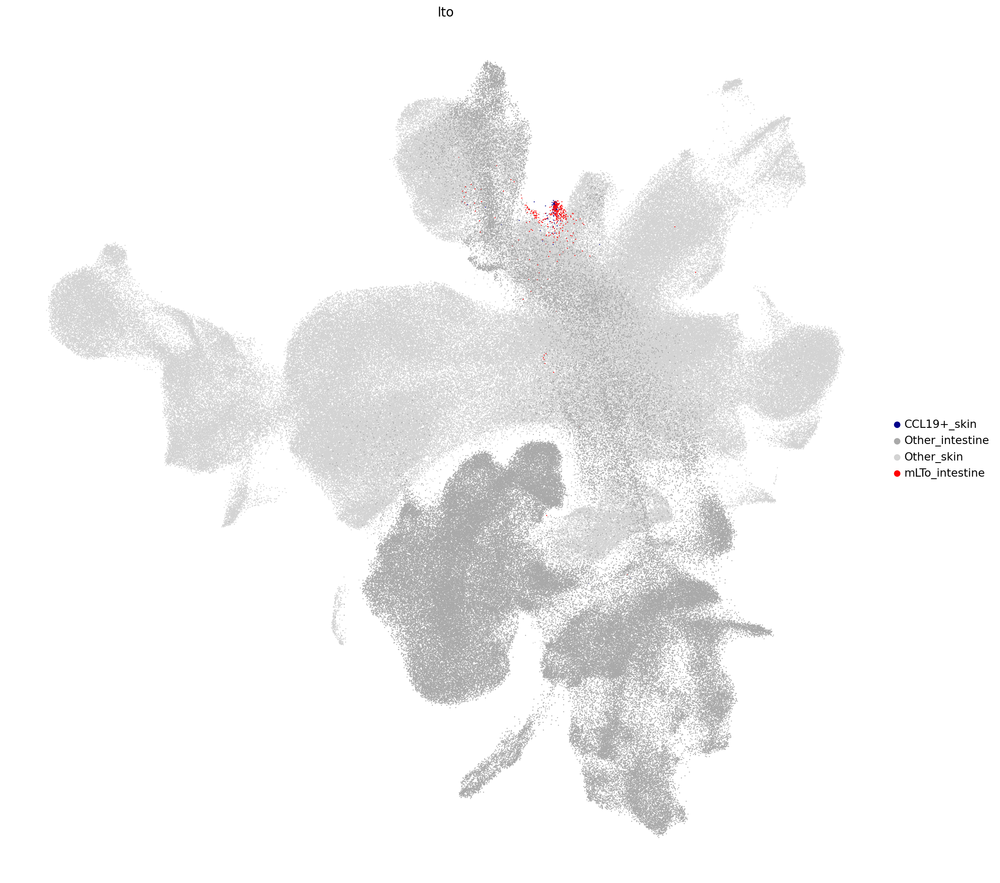

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


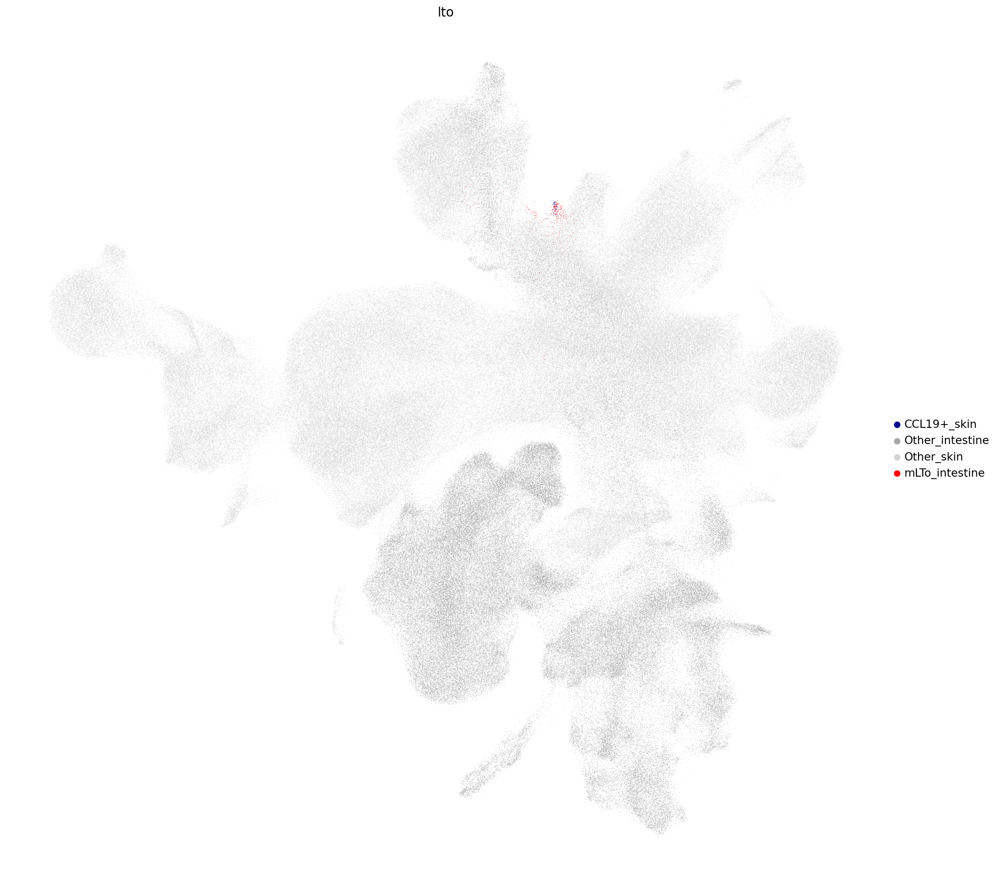

In [5]:
custom_colors = {
    "mLTo_intestine": '#ff0000',
    "CCL19+_skin": '#00008b',
    "Other_skin": "#d3d3d3",
    "Other_intestine": "#a9a9a9"
}

adata.obs['lto'] = adata.obs['lto'].astype('category')
adata.uns['lto_colors'] = [custom_colors[cat] for cat in adata.obs['lto'].cat.categories]
sc.pl.umap(
    adata,
    color="lto",
    vmax=0.8,
    s=5,
    legend_fontsize=12,
    save="8c_lto_umap_size5.pdf"
)
sc.pl.umap(
    adata,
    color="lto",
    vmax=0.8,
    s=1,
    legend_fontsize=12,
    save="8c_lto_umap_size1.pdf"
)

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

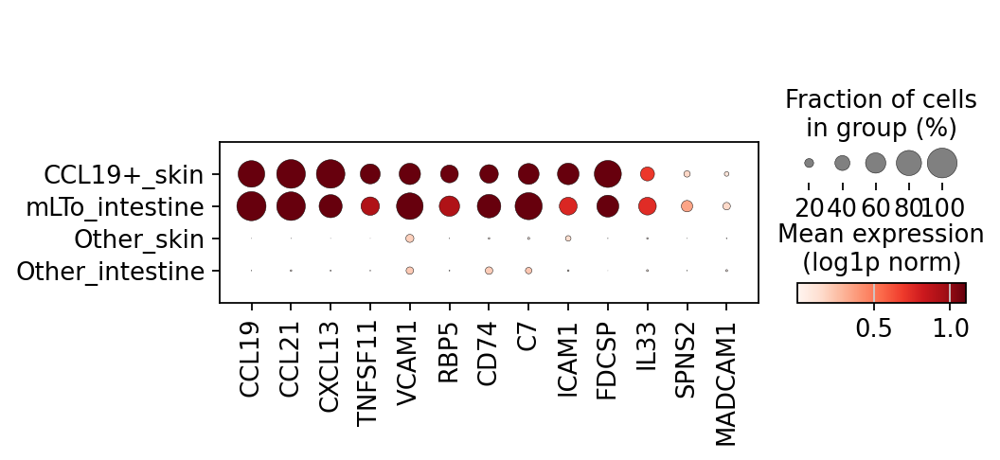

In [6]:
desired_order = ['CCL19+_skin', 'mLTo_intestine', 'Other_skin', 'Other_intestine']

adata.obs["lto"] = pd.Categorical(adata.obs["lto"], categories=desired_order, ordered=True)
lto_genes=['CCL19', 'CCL21', 'CXCL13',  'TNFSF11',  'VCAM1', 'RBP5', 'CD74',  
           'C7',
          'ICAM1',   
           'FDCSP', 'IL33', 'SPNS2', 'MADCAM1',
          ]



sc.pl.dotplot(
    adata,
    lto_genes,
    groupby="lto",
    vmax=1.1,
    colorbar_title='Mean expression\n(log1p norm)',
    dendrogram=False,
        save="fig8c_lto_dotplot_hoz_NEW.pdf"

)



In [7]:
adata = adata[~adata.obs["lto"].str.startswith("Other")]

# fig 8d

In [8]:
adata_f3=sc.read_h5ad( '/nfs/team298/ls34/fibroblast_atlas_paper/final_adatas_chloecolours/adata_11_f3only.h5ad')
adata_f3.obs["lto"]=adata_f3.obs["test13"]
adata_f3.X[:6,:6].A


array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.60110346, 0.        , 0.60110346, 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 1.61943235, 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ]])

In [9]:
adata_combined = ad.concat([adata,adata_f3])

In [10]:
import pickle

pickle_file_path = '/nfs/team298/ls34/fb_dict.pkl'

with open(pickle_file_path, 'rb') as file:
    reynolds_short_final = pickle.load(file)
reynolds_short_final["F3"]




['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 'HLA-DRA',
 'HLA-DRB1']

In [11]:
f3_markers = {"F3 markers (adult)": reynolds_short_final["F3"],
              "Additional LTo genes": [x for x in lto_genes if x not in reynolds_short_final["F3"]]}

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

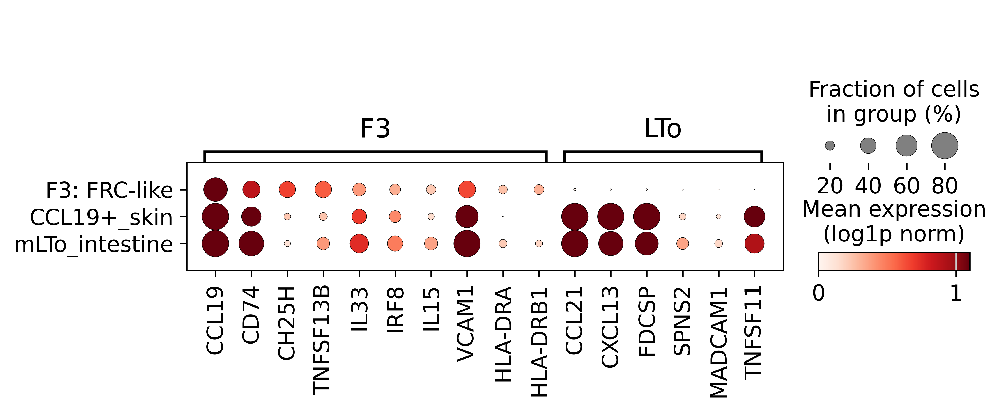

In [12]:
F3_GENES = {"F3":  ['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 'HLA-DRA',
 'HLA-DRB1'],            
           "LTo": [ 'CCL21',
 "CXCL13",'FDCSP', 'SPNS2', 'MADCAM1',
    'TNFSF11', #'RBP5',
                # 'C7', 'ICAM1', 
                  
              ]
  
           }
sc.settings.set_figure_params(dpi=300, dpi_save=300, facecolor="white", frameon=False, figsize=(17,17))
sc.pl.dotplot(
    adata_combined,
    F3_GENES,
    groupby="lto",
    vmax=1.1,
         dot_max=.8,
    colorbar_title='Mean expression\n(log1p norm)',
    dendrogram=False,
        #save="fig8a_lto_dotplot_hoz_NEW.pdf"
    categories_order=["F3: FRC-like",
    "CCL19+_skin", "mLTo_intestine"],
                save="fig8c2_lto_dotplot_hoz_NEW.pdf"


)


 


# fig 8e

In [13]:
PATH='/nfs/team298/ls34/fibroblast_atlas_paper/final_adatas_chloecolours/adata_all.h5ad'
adata_f3=sc.read_h5ad(PATH)

In [14]:
adata_f3=adata_f3[adata_f3.obs["test13"].str.startswith("F3")]

In [15]:
f3_genes = { 'F3': ['CCL19',"CD74" ,  'CH25H',  "TNFSF13B",  'IL33', "IRF8" , 
        "IL15",
        "VCAM1", "HLA-DRA", "HLA-DRB1",
                            
 
           ], "Activated": ["ADAMDEC1", "CXCL9", 
                            
                           ],
           "Additional LTo": [  "CXCL13",  "CTSH", "PTGDS", "TNFSF11"]
           }
        


In [16]:
xtick_order_orig= ['Prurigo nodularis',
       'Eczema', 'Alopecia areata', 'Drug reaction: lichenoid',
       'Psoriasis', 'Lupus (SCLE)', 'Erythema migrans', 'Drug reaction: DRESS',
        'Hidradenitis suppurativa',
       'Sarcoidosis', 'Granuloma annulare', 'Acne', 'Lupus (DLE)',
       'Acral melanoma',
       'Cutaneous melanoma', 'Basal cell carcinoma', 'Squamous cell carcinoma',
       'Cancer_spacer', 'Keloid scar', 'Non-keloid scar', 'Systemic sclerosis',
       'Morphoea (pansclerotic)', 'Dupuytren contracture',
       'Neurofibroma', ]

(23147, 36601)


/tmp/ipykernel_19404/3582579979.py:34: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs

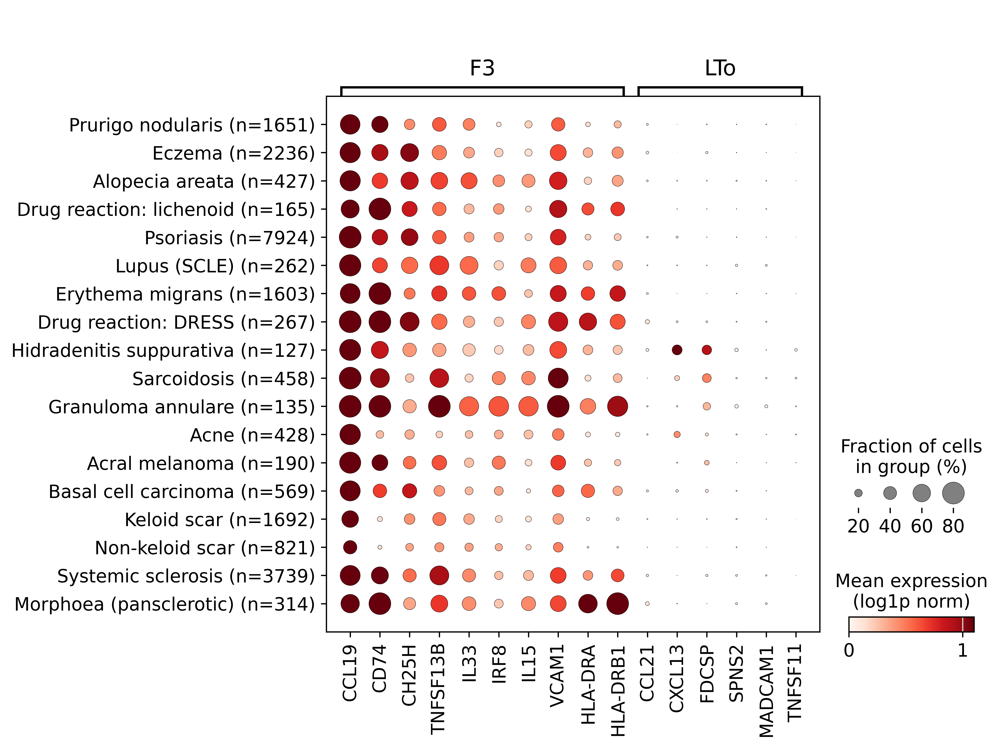

In [20]:
F3_GENES = {"F3":  ['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 'HLA-DRA',
 'HLA-DRB1'],            
           "LTo": [ 'CCL21',
 "CXCL13",'FDCSP', 'SPNS2', 'MADCAM1',
    'TNFSF11', #'RBP5',
                # 'C7', 'ICAM1', 
                  
              ]
  
           }

        

for x in [ 'F3: FRC-like', ]:  
    adata_i = adata_f3[adata_f3.obs["Patient_status2"]!="Nonlesional"]
    print(adata_i.shape)
    counts = pd.Series(adata_i.obs['Patient_status2']).value_counts()
    filtered_counts = counts[counts > 100]
    filtered_categories = filtered_counts.index.tolist()
    xtick_order_filtered = [category for category in xtick_order_orig if category in filtered_categories]
    xtick_order_with_counts = [
        f"{category} (n={filtered_counts[category]})"
        for category in xtick_order_filtered
    ]
    adata_i_filtered = adata_i[adata_i.obs['Patient_status2'].isin(filtered_categories)]
    adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
        lambda x: f"{x} (n={filtered_counts[x]})"
    )
    sc.pl.dotplot(
            adata_i_filtered,
           F3_GENES,
            groupby="Patient_status2_with_counts",
            vmax=1.1,colorbar_title='Mean expression\n(log1p norm)', 
            #standard_scale="var",
            cmap="Reds",
            dot_max=.8,

            categories_order=xtick_order_with_counts,
            save="8e_diseasepolaridation_dotplot.pdf"
        )
 

# fig 8a

In [21]:
PATH= '/nfs/team298/ls34/fibroblast_atlas_paper/final_adatas_chloecolours/adata_prenatal_skin_all.h5ad'
adata=sc.read_h5ad(PATH)


In [22]:
adata=adata[adata.obs["test13"]!="ePericytes"]
adata=adata[adata.obs["test13"]!="Adipocytes"]


In [23]:
sc.pl.umap(adata, 
           color = ["Mapping_status2"],
          #legend_loc="on data",
          legend_fontsize=6,vmax=10,title='',
          s=5,
           palette = [  "#90B0FE",
        
          "#E8E0DF",],
           save="8a_umap_fetal_vs_adult.pdf"
          )
           


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [24]:

COLORS = {

    
    'F1: Superficial': '#ffef5a',
 'F2: Universal': '#91bae2',
 'F3: FRC-like': '#c6508f',
 'F4: DS_DPEP1+': '#3d6f3b',
 'F4: TNN+COCH+':  '#00f273',
 'F2/3: Stroma_PPARG+': '#364f99',
 'F5: NGFR+':  '#8981a7',
 'F4: DP_HHIP+': '#c9efb4',
 'F5: RAMP1+':'#4b2657',
 'F_Fascia':"#0000004D",
 'F7: Fascia-like myofibroblast':  '#dd7465',
 'F6: Myofibroblast':  "#2f6565",
 'F6: Inflammatory myofibroblast': "#75fbfd",

'Dermal papilla': np.array([0.3, 0.0, 0.0, 1.0]),  # Darkest Red  
'Dermal condensate': np.array([0.6, 0.1, 0.1, 1.0]),  # Darker Crimson
    'Pre-dermal condensate': np.array([1.0, 0.3, 0.3, 1.0]),  # Bright Red

    'HOXC5+ early fibroblast': np.array([1.0, 0.4, 0.6, 1.0]),  # Hot Pink
'FRZB+ early fibroblast': np.array([0.9, 0.9, 0.9, 1.0]),  # Very Light Grey

    'PEAR1+ fibroblast': np.array([1.0, 0.7, 0.7, 1.0]),  # Very Light Red
'COLEC11+C7+ fibroblast': np.array([0.0, 0.1, 0.6, 1.0]),  # Dark Electric Blue
    'CCL19+_skin': np.array([1.0, 0.7, 0.3, 1.0]),  # Pale Orange


    'WNT2+ fibroblast': np.array([0.2, 0.2, 0.2, 1.0]),  # Almost Black
    'WNT2+ Adipocytes': np.array([0.5, 0.5, 0.5, 1.0]),  # Medium Grey
    'Myofibroblasts': np.array([0.8, 0.8, 0.8, 1.0]),  # Light Grey
}


adata.obs["test13"] = pd.Categorical(adata.obs["test13"], categories=COLORS.keys(), ordered=True)
adata.uns["test13_colors"] = [COLORS[cat] for cat in adata.obs["test13"].cat.categories]


sc.pl.umap(
    adata, 
    color=["test13"], 
    legend_fontsize=6,
    legend_fontoutline=2,
    s=5,
    title='',
    save="8a_prenatal_umap_celltypes2c.pdf"
)


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1107: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to

In [25]:
import gc
del(adata)
gc.collect()

49591

# 8b

In [26]:
PATH =  '/nfs/team298/ls34/fibroblast_atlas_paper/final_adatas_chloecolours/adata_prenatal_skin_fbonly.h5ad'
adata_fetal=sc.read_h5ad(PATH)
adata_fetal.X[:6,:6].A

array([[0., 0., 0., 0., 0., 0.],
       [1., 0., 2., 0., 0., 0.],
       [0., 0., 4., 0., 0., 0.],
       [1., 0., 1., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [27]:
sc.pp.normalize_total(adata_fetal, target_sum=1e4)
sc.pp.log1p(adata_fetal)


In [28]:
df2=pd.read_csv("degs_fbs.csv")

In [29]:
RENAME = {"CCL19+ fibroblasts (mLTO)": "CCL19+_skin"}
adata_fetal.obs['test13']=adata_fetal.obs['test13'].map(RENAME).fillna(adata_fetal.obs['test13'])
adata_fetal.obs.test13.value_counts()

test13
WNT2+ fibroblast           74299
HOXC5+ early fibroblast    34303
Pre-dermal condensate      34181
Dermal condensate          23190
PEAR1+ fibroblast          18671
Myofibroblasts             15286
Dermal papilla             13240
FRZB+ early fibroblast     11041
WNT2+ Adipocytes            3156
COLEC11+C7+ fibroblast       510
CCL19+_skin                  109
Name: count, dtype: int64

In [30]:
CONTROL_SIZE = 200 #default 50 (100 was good)
N_BINS=25 #default 25 (10 was good)
N = 50

adata_fetal = sc.tl.score_genes(adata_fetal, df2["F1: Superficial"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F1")

In [31]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F2: Universal"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F2")
gc.collect()

781

In [32]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F2: Universal"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F2")
gc.collect()

352

In [33]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F2/3: Stroma_PPARG+"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F2/3")
gc.collect()

489

In [34]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F3: FRC-like"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F3")
gc.collect()

361

In [35]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F4: DS_DPEP1+"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: DS")
gc.collect()

363

In [36]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F4: DP_HHIP+"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: DP_HHIP+")
gc.collect()

365

In [37]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F4: TNN+COCH+"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: TNN+COCH+")
gc.collect()

367

In [38]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F5: RAMP1+"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F5: RAMP1+")
gc.collect()

369

In [39]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F5: NGFR+"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F5: NGFR+")
gc.collect()

371

In [40]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F6: Inflammatory myofibroblast"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F6")
gc.collect()

375

In [41]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F6: Myofibroblast"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F7")
gc.collect()


375

In [42]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F7: Fascia-like myofibroblast"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F8")
gc.collect()

377

In [43]:
adata_fetal = sc.tl.score_genes(adata_fetal, df2["F_Fascia"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F_Fascia")

gc.collect()

379

In [44]:
fetal_fb_order=['Dermal papilla',
     'Dermal condensate',
 'Pre-dermal condensate',
     'HOXC5+ early fibroblast',
 'FRZB+ early fibroblast',
 'PEAR1+ fibroblast',
 'COLEC11+C7+ fibroblast', 'CCL19+_skin',



 'WNT2+ fibroblast',
 'WNT2+ Adipocytes',
'Myofibroblasts',]

In [45]:
def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks= [0, 0.5, 1], dataset_name= "Prenatal Fibroblasts",
               reorder_dict=None, reorder_list = None, savepath="genemodule_no_n_specified.pdf", FIGSIZE=(8,8)):
    max_score = cluster_scores.max().max()
    figsize = FIGSIZE
    if reorder_list:
        cluster_scores = cluster_scores.loc[reorder_list]
    if reorder_dict:
        cluster_scores.rename(columns=reorder_dict, inplace=True)
    if not normalisation:
        cluster_scores_normalized = cluster_scores  #/ max_score
    else:
        if normalisation == "max":
            cluster_scores_normalized = cluster_scores / max_score
        elif normalisation == "minmax":
            cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
        elif normalisation == "row":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
        elif normalisation == "col":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
        else:
            print("Not valid normalisation method. ['max', 'minmax', 'row', 'col']")

    # Set the figure size before plotting
    plt.figure(figsize=figsize)  # Adjust as needed

    # Create the heatmap
    ax = sns.heatmap(
        cluster_scores_normalized.T,  # Transpose to get genes on y and clusters on x
        cmap=cmap,
        linewidths=0.0,
        linecolor=None,  # Add this
        square=True,  # Force square cells, sometimes fixes grid issues
        cbar_kws={"label": "Gene module score"},
        vmin=0  # Set the minimum value of the colorbar to 0
    )

    sns.despine()  # Removes spines, which may contribute to grid-like appearance
    cbar = ax.collections[0].colorbar
    #cbar.set_ticks(colorbar_ticks)
    #cbar.set_ticklabels(colorbar_ticks)

    # Add titles and labels as needed
    plt.title(normalisation)
    plt.xlabel(dataset_name)
    plt.ylabel('Adult Fibroblast Gene Modules')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    plt.style.use("seaborn-white")  # Removes unnecessary background
    sns.set_style("white")
    plt.tight_layout()

    # Save the plot
    plt.savefig(f'{savepath}', dpi=300, bbox_inches="tight", format="pdf")
    plt.show()


In [46]:
sc.settings.verbosity=0 # verbosity: errors (0), warnings (1), info (2), hints (3)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
#plt.rcParams['dpi'] = 300
plt.style.use('seaborn-white')

sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(15,15))
sc.settings.figdir = "sfig8"

/tmp/ipykernel_19404/4090426805.py:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


/tmp/ipykernel_19404/2706515240.py:48: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-white")  # Removes unnecessary background


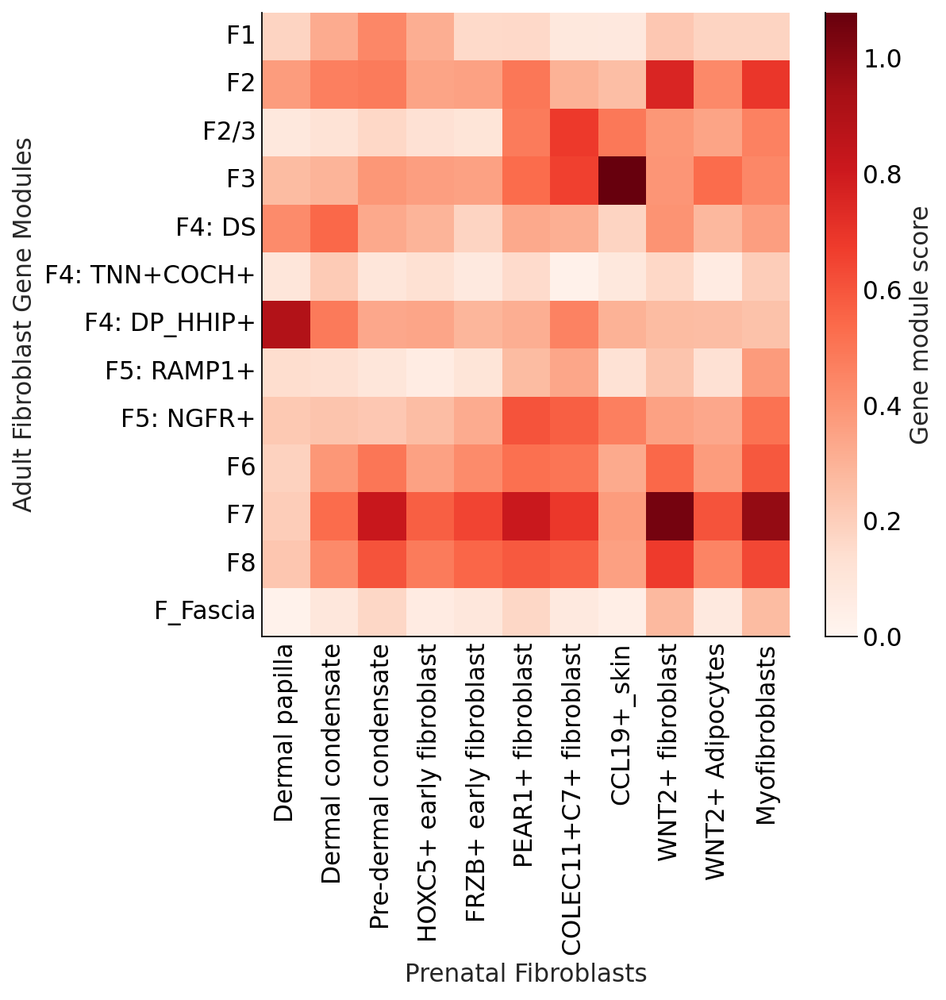

50  genes


In [47]:
cluster_scores = adata_fetal.obs.groupby('test13')[['F1', "F2", "F2/3", "F3", "F4: DS",
                                                 "F4: TNN+COCH+", "F4: DP_HHIP+", "F5: RAMP1+",
                                                 "F5: NGFR+", "F6", "F7", "F8", "F_Fascia"]].mean()

plot_matrix(cluster_scores, 
            cmap="Reds", 
            normalisation=None, 
            colorbar_ticks= [0, 0.5, 1], 
            dataset_name= "Prenatal Fibroblasts",
            reorder_dict=None, 
            reorder_list = fetal_fb_order,
            savepath=f"fig8/8b_genemodule_fetal_{N}.pdf"
           )
print(N, " genes")

/tmp/ipykernel_19404/2706515240.py:48: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-white")  # Removes unnecessary background


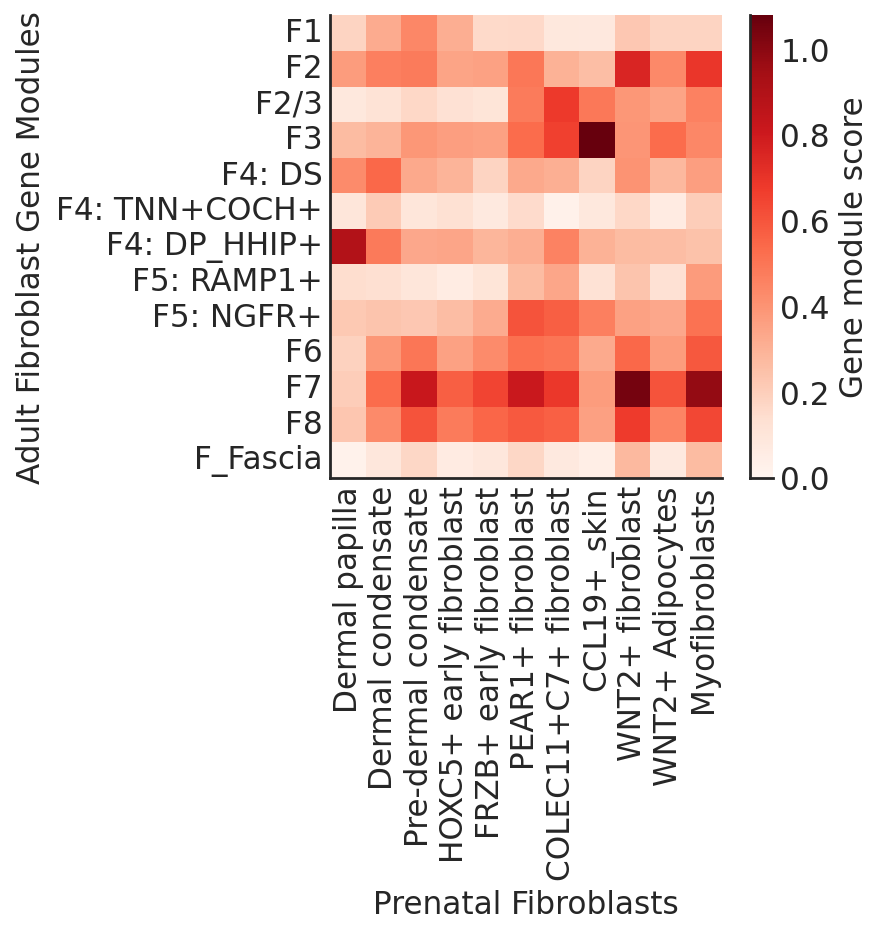

50  genes


In [48]:
plot_matrix(cluster_scores, 
            cmap="Reds", 
            normalisation=None, 
            colorbar_ticks= [0, 0.5, 1], 
            dataset_name= "Prenatal Fibroblasts",
            reorder_dict=None, 
            reorder_list = fetal_fb_order,
            savepath=f"fig8/8b_genemodule_fetal_{N}_SIE4.pdf",
            FIGSIZE=(6, 6)
           )
print(N, " genes")


# Mouse figures



use fig8_mouse.ipynb

In [ ]:
sc.logging.print_versions()


